In [5]:
import numpy as np
from collections import Counter, defaultdict
from scipy.stats import entropy

def build_transition_matrix(seq):
    transitions = defaultdict(Counter)
    for i in range(len(seq) - 1):
        transitions[seq[i]][seq[i+1]] += 1
    return transitions

def compute_importance(event_freq, transitions):
    importance = {}
    for event, freq in event_freq.items():
        next_events = transitions.get(event, {})
        if next_events:
            probs = np.array(list(next_events.values())) / sum(next_events.values())
            mean_prob = probs.mean()
            importance[event] = freq * mean_prob
        else:
            importance[event] = 0
    return importance

def prune_sequence(seq, importance, threshold):
    keep_set = {eid for eid, score in importance.items() if score >= threshold}
    pruned_seq = [eid for eid in seq if eid in keep_set]
    return pruned_seq, keep_set

def kl_divergence(p, q, epsilon=1e-10):
    all_keys = set(p.keys()) | set(q.keys())
    p_dist = np.array([p.get(k, 0) for k in all_keys], dtype=float)
    q_dist = np.array([q.get(k, 0) for k in all_keys], dtype=float)

    # Add epsilon to avoid zero division
    p_dist += epsilon
    q_dist += epsilon

    # Normalize
    p_dist /= p_dist.sum()
    q_dist /= q_dist.sum()

    return entropy(p_dist, q_dist)


def prune_with_kl(seq, importance_threshold=1):
    original_freq = Counter(seq)
    transitions = build_transition_matrix(seq)
    importance = compute_importance(original_freq, transitions)
    
    pruned_seq, kept = prune_sequence(seq, importance, importance_threshold)
    pruned_freq = Counter(pruned_seq)
    
    kl = kl_divergence(original_freq, pruned_freq)
    
    return {
        'pruned_sequence': pruned_seq,
        'kept_event_ids': kept,
        'original_freq': original_freq,
        'pruned_freq': pruned_freq,
        'kl_divergence': kl
    }


In [2]:
from models import LogTokenizer

tokenizer = LogTokenizer("drain3_state.bin")
tokenizer.load_state()

config file not found: drain3.ini


In [3]:
def _read_data(path):
    with open(path, "r", encoding="utf8") as f:
        raw = [line.split(maxsplit=9) for line in f]
        data = [r[-1] for r in raw]
    return data

sequence = [tokenizer.get_event_id(data) for data in _read_data("data/BGL/BGL.log")]

In [6]:
result = prune_with_kl(sequence, importance_threshold=3)
print("KL divergence:", result['kl_divergence'])
print("Pruned sequence:", result['pruned_sequence'])

KL divergence: 0.01093364282742575
Pruned sequence: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def threshold_sweep(sequence, thresholds=np.linspace(0, 10, 100)):
    original_freq = Counter(sequence)
    transitions = build_transition_matrix(sequence)
    importance = compute_importance(original_freq, transitions)

    kl_vals = []
    num_events = []
    
    for t in thresholds:
        pruned_seq, kept = prune_sequence(sequence, importance, t)
        pruned_freq = Counter(pruned_seq)
        kl = kl_divergence(original_freq, pruned_freq, epsilon=1e-10)

        kl_vals.append(kl)
        num_events.append(len(kept))

    return thresholds, kl_vals, num_events

def plot_threshold_sweep(thresholds, kl_vals, num_events):
    fig, ax1 = plt.subplots()

    ax1.set_xlabel('Importance Threshold')
    ax1.set_ylabel('KL Divergence', color='tab:red')
    ax1.plot(thresholds, kl_vals, color='tab:red', label='KL Divergence')
    ax1.tick_params(axis='y', labelcolor='tab:red')
    ax1.set_ylim(bottom=0)

    ax2 = ax1.twinx()
    ax2.set_ylabel('# Events Kept', color='tab:blue')
    ax2.plot(thresholds, num_events, color='tab:blue', label='# Events Kept')
    ax2.tick_params(axis='y', labelcolor='tab:blue')

    fig.tight_layout()
    plt.title("Threshold Sweep: KL Divergence & Event Count")
    plt.show()


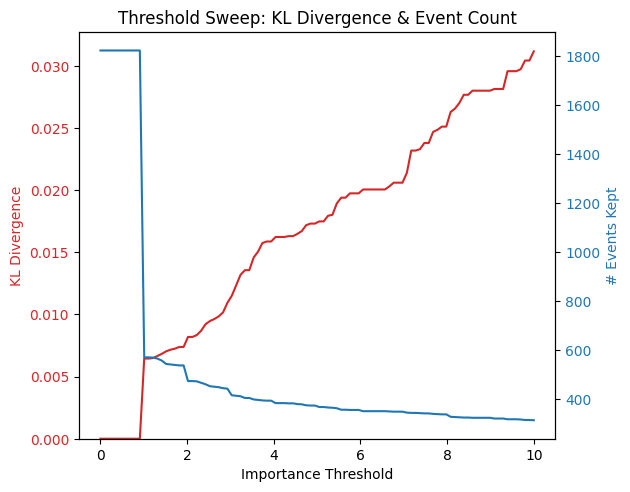

In [15]:
thresholds, kl_vals, num_events = threshold_sweep(sequence)
plot_threshold_sweep(thresholds, kl_vals, num_events)

In [9]:
def plot_event_distributions(original_seq, pruned_seq, top_k=10):
    original_freq = Counter(original_seq)
    pruned_freq = Counter(pruned_seq)

    top_events = [eid for eid, _ in original_freq.most_common(top_k)]
    
    orig_vals = [original_freq.get(eid, 0) for eid in top_events]
    pruned_vals = [pruned_freq.get(eid, 0) for eid in top_events]

    x = np.arange(len(top_events))
    width = 0.35

    plt.bar(x - width/2, orig_vals, width, label='Original')
    plt.bar(x + width/2, pruned_vals, width, label='Pruned')

    plt.xticks(x, top_events)
    plt.ylabel('Frequency')
    plt.title(f'Top {top_k} Event Frequencies')
    plt.legend()
    plt.show()


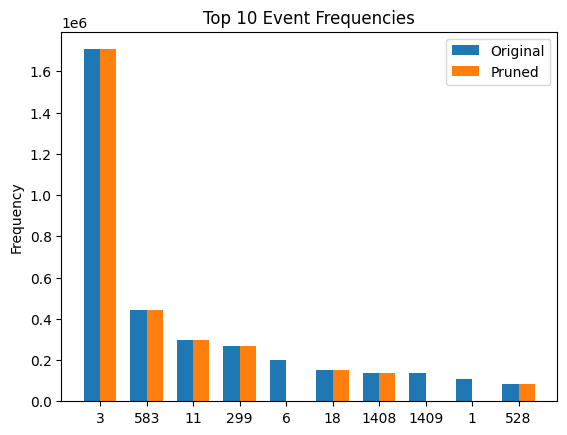

In [13]:
result = prune_with_kl(sequence, importance_threshold=10000)
plot_event_distributions(sequence, result['pruned_sequence'])

In [50]:
from collections import Counter
import numpy as np

def window_entropy(window):
    counts = np.array(list(Counter(window).values()), dtype=float)
    probs = counts / counts.sum()
    return -np.sum(probs * np.log2(probs))

def filter_low_entropy(sequence, window_size=10, entropy_threshold=0.1, stride=5, keep_ratio=0.1):
    filtered = []
    i = 0
    while i <= len(sequence) - window_size:
        window = sequence[i:i+window_size]
        ent = window_entropy(window)

        if ent < entropy_threshold:
            # Downsample repetitive windows
            if np.random.rand() < keep_ratio:
                filtered.extend(window)
        else:
            filtered.extend(window)
        
        i += stride  # stride can be less than window_size to create overlap
    
    return filtered

In [25]:
def sweep_entropy_thresholds(sequence, thresholds=np.linspace(0.0, 10.0, 70)):
    original_freq = Counter(sequence)
    kl_scores = []
    lengths = []

    for t in thresholds:
        cleaned = filter_low_entropy(sequence, entropy_threshold=t)
        cleaned_freq = Counter(cleaned)
        kl = kl_divergence(original_freq, cleaned_freq)
        kl_scores.append(kl)
        lengths.append(len(cleaned))
    
    return thresholds, kl_scores, lengths

def plot_entropy_kl(thresholds, kl_scores, lengths):
    fig, ax1 = plt.subplots()

    ax1.set_xlabel('Entropy Threshold')
    ax1.set_ylabel('KL Divergence', color='tab:red')
    ax1.plot(thresholds, kl_scores, color='tab:red', label='KL Divergence')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Cleaned Sequence Length', color='tab:blue')
    ax2.plot(thresholds, lengths, color='tab:blue', linestyle='--', label='Length')
    ax2.tick_params(axis='y', labelcolor='tab:blue')

    fig.tight_layout()
    plt.title('KL Divergence vs Entropy Threshold (Low-Entropy Pruning)')
    plt.show()

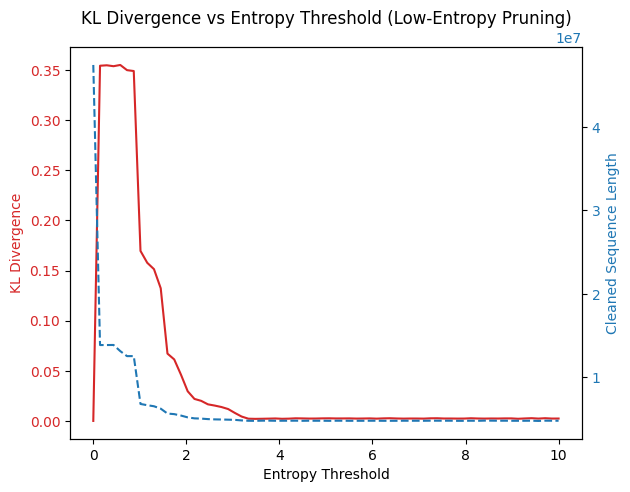

In [26]:
thresholds, kl_scores, lengths = sweep_entropy_thresholds(sequence)
plot_entropy_kl(thresholds, kl_scores, lengths)

In [37]:
cleaned = filter_low_entropy(sequence, entropy_threshold=1000000)
cleaned_freq = Counter(cleaned)
original_freq = Counter(sequence)
print("Optimal KL divergence: ", kl_divergence(original_freq, cleaned_freq))

Optimal KL divergence:  0.00242238822082012


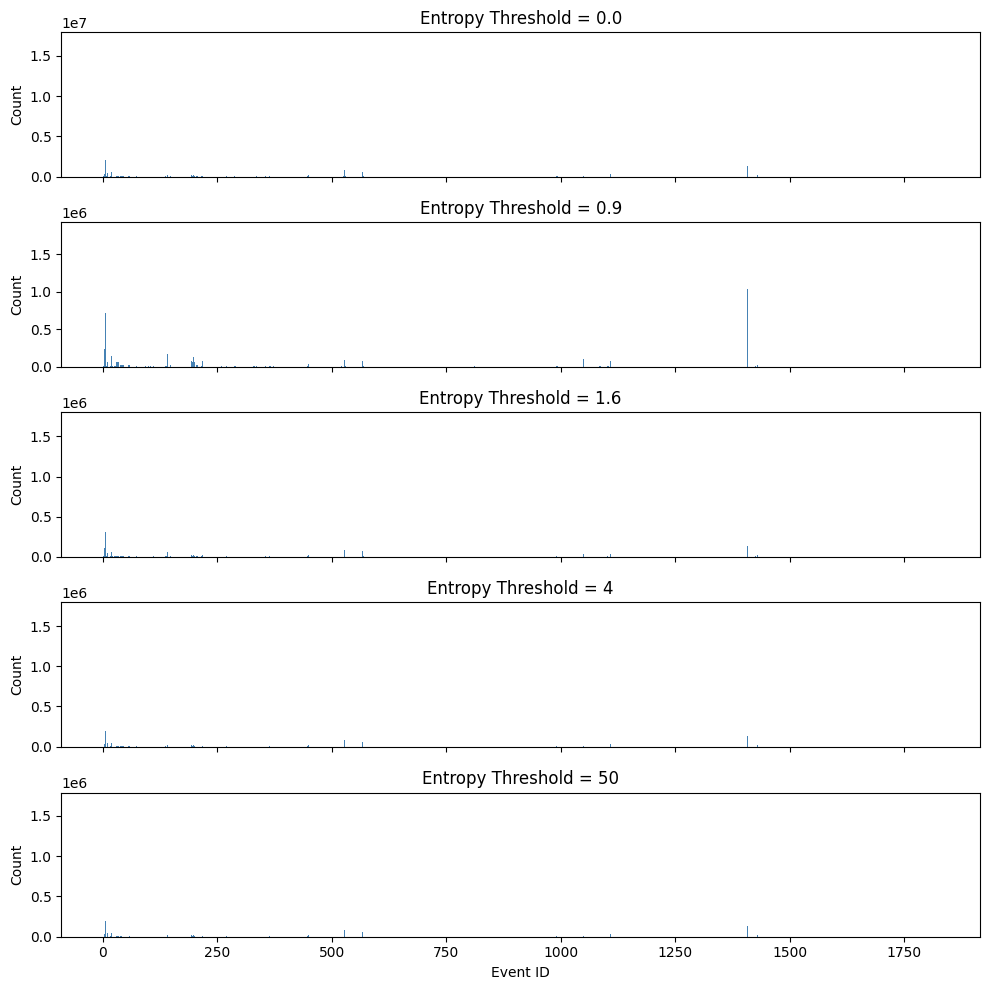

In [35]:
def plot_histograms_for_thresholds(sequence, thresholds=[0.0, 0.9, 1.6, 4, 50]):
    fig, axs = plt.subplots(len(thresholds), 1, figsize=(10, 10), sharex=True)
    for idx, t in enumerate(thresholds):
        cleaned = filter_low_entropy(sequence, entropy_threshold=t)
        counts = Counter(cleaned)
        keys = sorted(counts)
        values = [counts[k] for k in keys]

        axs[idx].bar(keys, values, color='steelblue')
        axs[idx].set_title(f"Entropy Threshold = {t}")
        axs[idx].set_ylabel("Count")
    
    axs[-1].set_xlabel("Event ID")
    plt.tight_layout()
    plt.show()

plot_histograms_for_thresholds(sequence)

In [47]:
import numpy as np
from scipy.stats import entropy

def js_divergence(p, q, epsilon=1e-10):
    all_keys = set(p.keys()) | set(q.keys())
    p_dist = np.array([p.get(k, 0) for k in all_keys], dtype=float)
    q_dist = np.array([q.get(k, 0) for k in all_keys], dtype=float)

    # Avoid zero values
    p_dist += epsilon
    q_dist += epsilon

    # Normalize
    p_dist /= p_dist.sum()
    q_dist /= q_dist.sum()

    m = 0.5 * (p_dist + q_dist)

    js = 0.5 * entropy(p_dist, m) + 0.5 * entropy(q_dist, m)
    return js

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from statistics import mean

def sweep_entropy_thresholds(sequence, window_sizes=[10], thresholds=np.linspace(0.0, 1024.0, 100)):
    original_freq = Counter(sequence)
    js_scores_by_ws = {w: [] for w in window_sizes}
    lengths_by_ws = {w: [] for w in window_sizes}

    # Store per-threshold average across window sizes
    avg_js_scores = []
    avg_lengths = []

    for t in thresholds:
        js_per_t = []
        len_per_t = []

        for w in window_sizes:
            cleaned = filter_low_entropy(sequence, entropy_threshold=t, window_size=w, stride=40)
            cleaned_freq = Counter(cleaned)
            js = js_divergence(original_freq, cleaned_freq)

            js_scores_by_ws[w].append(js)
            lengths_by_ws[w].append(len(cleaned))

            js_per_t.append(js)
            len_per_t.append(len(cleaned))

        avg_js_scores.append(mean(js_per_t))
        avg_lengths.append(mean(len_per_t))
    
    return thresholds, avg_js_scores, avg_lengths, js_scores_by_ws, lengths_by_ws

def plot_entropy_js(thresholds, avg_js_scores, avg_lengths):
    fig, ax1 = plt.subplots()

    ax1.set_xlabel('Entropy Threshold')
    ax1.set_ylabel('Avg Jensen-Shannon Divergence', color='tab:red')
    ax1.plot(thresholds, avg_js_scores, color='tab:red', label='Avg JS Divergence')
    ax1.tick_params(axis='y', labelcolor='tab:red')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Avg Cleaned Sequence Length', color='tab:blue')
    ax2.plot(thresholds, avg_lengths, color='tab:blue', linestyle='--', label='Avg Length')
    ax2.tick_params(axis='y', labelcolor='tab:blue')

    fig.tight_layout()
    plt.title('Average JS Divergence vs Entropy Threshold (Multiple Window Sizes)')
    plt.show()


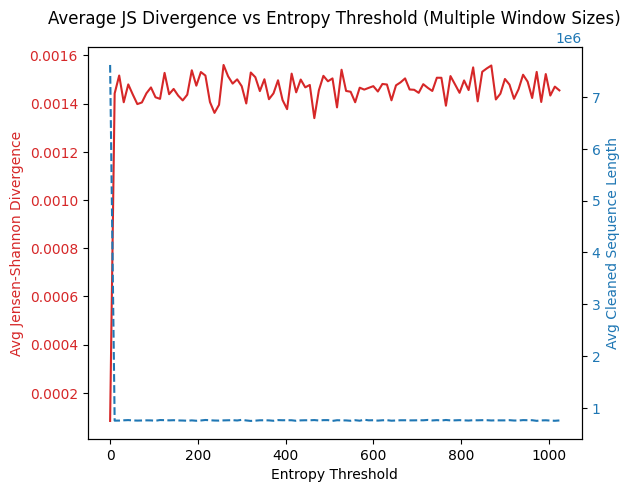

In [100]:
window_sizes = [5, 10, 20, 50, 100, 200]
thresholds, avg_js, avg_lens, all_js, all_lens = sweep_entropy_thresholds(sequence, window_sizes, thresholds)
plot_entropy_js(thresholds, avg_js, avg_lens)

In [82]:
original_freq = Counter(sequence)
cleaned = filter_low_entropy(sequence, entropy_threshold=390, window_size=20)
cleaned_freq = Counter(cleaned)
print(cleaned[:100])

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [84]:
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

def sweep_random_removal(sequence, removal_counts):
    original_freq = Counter(sequence)
    js_scores = []

    for n in removal_counts:
        if n >= len(sequence):
            js_scores.append(np.nan)
            continue

        # Randomly remove n events
        indices_to_remove = set(random.sample(range(len(sequence)), n))
        cleaned = [s for i, s in enumerate(sequence) if i not in indices_to_remove]

        cleaned_freq = Counter(cleaned)
        js = js_divergence(cleaned_freq, original_freq)
        js_scores.append(js)

    return removal_counts, js_scores

def plot_random_removal_js(removal_counts, js_scores):
    plt.figure(figsize=(8, 5))
    plt.plot(removal_counts, js_scores, color='tab:green', marker='o')
    plt.xlabel('Number of Events Removed Randomly')
    plt.ylabel('Jensen-Shannon Divergence')
    plt.title('JS Divergence vs Random Event Removal')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [98]:
removal_counts = np.linspace(0, len(sequence) - 1, 1000, dtype=int)
removal_counts, js_scores = sweep_random_removal(sequence, removal_counts)
plot_random_removal_js(removal_counts, js_scores)

KeyboardInterrupt: 

In [ ]:
def plot_js_comparison(removal_counts, js_random, entropy_lengths, js_entropy):
    plt.figure(figsize=(8, 5))
    plt.plot(removal_counts, js_random, label='Random Removal', color='tab:green', marker='o')
    plt.plot(entropy_lengths, js_entropy, label='Entropy-Based Pruning', color='tab:red', marker='x')

    plt.xlabel('Number of Events Removed')
    plt.ylabel('Jensen-Shannon Divergence')
    plt.title('JS Divergence: Random Removal vs Entropy-Based Pruning')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


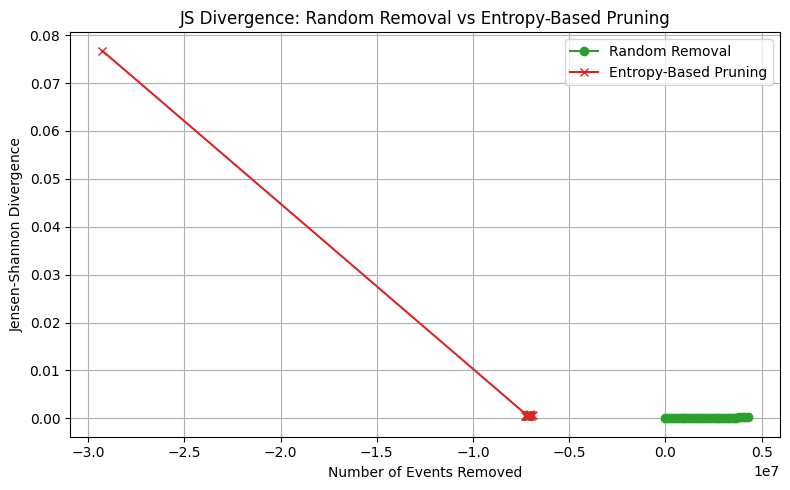

In [96]:
removal_counts = np.linspace(0, int(0.9 * len(sequence)), 30, dtype=int)
entropy_thresholds = np.linspace(1, 256, 30)

js_random, js_entropy, entropy_lengths = compare_random_vs_entropy(
    sequence, removal_counts, entropy_thresholds, window_size=1000, stride=40
)

plot_js_comparison(removal_counts, js_random, entropy_lengths, js_entropy)